In [1]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal as ss
import seaborn as sns
from scipy.ndimage import convolve1d
import psycopg2
import datetime
import time 

%matplotlib inline
sns.set()
pd.set_option("display.max_columns", None)
%load_ext autoreload
%autoreload 2

/Users/eventura/anaconda/envs/ppg/lib/python3.5/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
try:
    conn = psycopg2.connect(dbname='amiigo_platform_sherpa',
                            user='savvy_read',
                            host='10.1.0.141',
                            password='savvy_read',
                            port = '15610')
except:
    print("failed to connect")

In [3]:
from db import DB

amiigo_db = DB(dbname='amiigo_platform_sherpa',
                username='savvy_read',
                hostname='10.1.0.141',
                password='savvy_read',
                port = '15610', 
                dbtype = "postgres")

In [4]:
# Contents of the amiigo database

amiigo_db.tables

Refreshing schema. Please wait...done!


Table,Columns
activities_goal,"id, date, user_id, type, target, value"
activities_metric,"id, order, date, user_id, type, low, low_datetime, median, median_datetime, high, high_datetime, pstatus"
auth_group,"name, id"
auth_group_permissions,"group_id, permission_id, id"
auth_permission,"name, content_type_id, codename, id"
authtoken_token,"key, user_id, created"
celery_taskmeta,"task_id, status, result, date_done, traceback, hidden, meta, id"
celery_tasksetmeta,"taskset_id, result, date_done, hidden, id"
core_amiigouser,"password, last_login, is_superuser, username, first_name, last_name, email, is_staff, is_active, date_joined, is_developer, is_in_studygroup, height, weight, birthdate, sex, wristband_laterality, shoepod_laterality, provisioning_key_id, unit_of_measurement, location, image, gravatar_url, is_validated, validation_key, eye_color, hair_color, walk_stride, run_stride, resting_hr_awake, resting_hr_sleeping, minimum_hr, hr_variability, pulse_oxygen, respiratory_rate_lower, respiratory_rate_upper, arterial_pressure, sys_period, dia_period, avg_daily_steps, avg_daily_sleep, does_routine_workouts, muscle_targets, user_class, avg_calories_burned, avg_inactivity_time, avg_activity_time, avg_cardio_time, avg_resistance_time, pstatus, id"
core_amiigouser_groups,"amiigouser_id, group_id, id"


### Extract Sleep Data from Amiigo Database

In [5]:
res = amiigo_db.query("select user_id, count(user_id) from sleep_sleepdata group by user_id order by count(user_id) DESC")
res

,user_id,count
0,21,29
1,15,28
2,14,11
3,22,9
4,23,6
5,19,5
6,18,5
7,17,3
8,16,1


In [6]:
%%time
sleep_data  = amiigo_db.query("Select * from sleep_sleepdata")

CPU times: user 7.98 s, sys: 6.14 s, total: 14.1 s
Wall time: 9min 43s


In [7]:
users = amiigo_db.query("select * from core_amiigouser order by id")
users

,id,password,last_login,is_superuser,username,first_name,last_name,email,is_staff,is_active,date_joined,is_developer,is_in_studygroup,height,weight,birthdate,sex,wristband_laterality,shoepod_laterality,provisioning_key_id,unit_of_measurement,location,image,gravatar_url,is_validated,validation_key,eye_color,hair_color,walk_stride,run_stride,resting_hr_awake,resting_hr_sleeping,minimum_hr,hr_variability,pulse_oxygen,respiratory_rate_lower,respiratory_rate_upper,arterial_pressure,sys_period,dia_period,avg_daily_steps,avg_daily_sleep,does_routine_workouts,muscle_targets,user_class,avg_calories_burned,avg_inactivity_time,avg_activity_time,avg_cardio_time,avg_resistance_time,pstatus
0,1,,2013-08-07 22:45:22.278000+00:00,True,admin,Amiigo,Admin,admin@amiigo.com,True,True,2013-08-07 22:33:08.330000+00:00,False,False,NaN,NaN,None,u,0,0,729ba328dc564d7784c1af875c4d67fe,imperial,None,,None,True,None,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,None,
1,2,pbkdf2_sha256$12000$EDbvHkvhPk0J$H4xgEfCrUfd0R...,2016-06-30 22:45:45.496417+00:00,True,luke,,,lgraybill@izeni.com,True,True,2016-04-28 02:39:43.255959+00:00,False,False,NaN,NaN,None,u,r,r,None,imperial,None,,https://secure.gravatar.com/avatar/247127df297...,False,None,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,None,failed:no app instance for user
2,3,pbkdf2_sha256$12000$f7eJ4Ordo9XD$rUL4IjquB30B2...,2016-11-29 15:15:45.498321+00:00,True,savvy_admin,,,,True,True,2016-04-29 23:45:09+00:00,True,False,NaN,NaN,None,u,r,r,None,imperial,,,None,False,None,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,,,None,None,None,None,None,failed:no app instance for user
3,5,pbkdf2_sha256$12000$URN87l2gDUCm$gniw0fxXxt6ff...,2016-07-01 18:24:48.045390+00:00,False,rosbsnjc,Rohintest,Bbb,rohin@gmail.com,False,True,2016-07-01 18:24:48.045470+00:00,False,False,170.18,72.57,1989-07-01,f,r,r,57beeabc23394ae59939f7e545935e70,imperial,"Mountain View, CA",,None,False,d641f0f053134049a4c46e9f1f6ecccb,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,None,failed:no app instance for user
4,7,pbkdf2_sha256$12000$wMi82f30a2FT$lUQve9C8BX2oh...,2016-07-01 22:09:55.264517+00:00,False,xxxzbzbx,Dhbxbx,Xbbz,r@d.com,False,True,2016-07-01 22:09:55.264597+00:00,False,False,170.18,72.57,1989-07-01,f,r,r,57beeabc23394ae59939f7e545935e70,imperial,shej@.fdndn,,None,False,87ef1cd9a22c4173ab5e389e391deeec,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,None,failed:no app instance for user
5,8,pbkdf2_sha256$12000$AVTyAroe9ERO$5qFHiB9hEZIHO...,2016-07-01 22:14:17.621770+00:00,False,sbsbd,D,D,she@f.com,False,True,2016-07-01 22:14:17.621843+00:00,False,False,170.18,72.57,1989-07-01,f,r,r,57beeabc23394ae59939f7e545935e70,imperial,Nzbdbdkkk,,None,False,f02eaaa7f5014f95b5135e79eb5306d7,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,None,failed:no app instance for user
6,9,pbkdf2_sha256$12000$Ty9PRpU99YTC$d/EKWHXeokAZW...,2016-07-01 22:14:58.929999+00:00,False,sdjxjx,Snjx,Dndndnd,s@d.com,False,True,2016-07-01 22:14:58.930075+00:00,False,False,170.18,72.57,1989-07-01,f,r,r,57beeabc23394ae59939f7e545935e70,imperial,Zjzj,,None,False,a0c283caa62f4af5a953b01fc3f9c0f3,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,None,failed:no app instance for user
7,10,pbkdf2_sha256$12000$9o5bphYS5p1c$A/kgR0qQ7qdFY...,2016-07-01 22:18:22.986061+00:00,False,d,Dave,Dave,d@d.com,False,True,2016-07-01 22:18:22.986140+00:00,False,False,170.18,72.57,1989-07-01,f,r,r,57beeabc23394ae59939f7e545935e70,imperial,"Mountain View, CA",,None,False,73d0cc92ca364f2998af98f90647ef30,u,u,None,None,NaN,NaN,None,None,None,None,None,None,None,None,None,None,False,None,None,None,None,None,None,N

In [8]:
## Select sleep data of a user

user = 'meventura'
userid = users.loc[users['username'] == user].id.values

sleep_data_user = (sleep_data.loc[sleep_data['user_id'] == userid[0]]).reset_index()


In [9]:
sleep_data_user

,index,created_at,modified_at,id,started_at,ended_at,calendar_date,data_integrity,data_integrity_reason,sample_counts,average_wristband_temp,average_shoepod_temp,calories_overall,duration,session_duration,bpm,bpm_detail,status,reboots,good_wristband_z_axis,good_shoepod_z_axis,pstatus,graph,analyzed_at,conversion_started_at,conversion_ended_at,compilation_started_at,compilation_ended_at,pulseoxy_started_at,pulseoxy_ended_at,pulseoxy_profiling,pulseoxy_debug_information,user_id,hash,analyze_raw,analyze_error,analyze_traceback,analyze_profiling,debug_information,beats,captures,biostats,user_timezone,task_id,calories_awake,calories_sleeping,sleep_duration,sleep_grade,fell_asleep,deep_sleep,light_sleep,woke_up,rem_segments,rem_duration,session_id
0,35,2016-12-01 07:11:54.646233+00:00,2016-12-01 07:12:49.453064+00:00,5ad11c430bc44810b51b0ee5f5cfb26c,2016-11-30 16:58:01.774000+00:00,2016-12-01 07:07:51.581000+00:00,2016-12-01,None,None,gAJ9cQEoWAUAAAB0b3RhbHECSt41AQBYDAAAADFDQkE4Qz...,105.08,None,0,50989,50990,0.0,None,finished,1,True,True,,gAJdcQEoR0BEAAAAAAAAVQVhd2FrZXEChnEDR0BEAAAAAA...,2016-12-01 07:12:49.452865+00:00,None,2016-12-01 07:11:54.898211+00:00,2016-12-01 07:12:43.513873+00:00,2016-12-01 07:12:46.721012+00:00,2016-12-01 07:11:57.951494+00:00,2016-12-01 07:12:42.028969+00:00,Profiling: 4972457 function calls (4941119 pri...,1 reboots detected!\n,22,5494cd0e7473a3d762710ad27539d038,gAJ9cQFYBAAAAG1ldGFxAn1xAyhVEHNlc3Npb25fZHVyYX...,None,None,Profiling: 1327727 function calls (1181027 pri...,None,"{'c.co': {'1480525762707': None, '148052542947...","{'deg.sp': {'1480528113774': None, '1480525276...","{'pp.volv.count': {'0': 8.0}, 'ppv.pc.min': {'...",Asia/Manila,153331c2-9c95-47cc-ae1b-4034ddb7f83f,124.25,289.15,22260.0,C,13890,17400.0,4860.0,50390,1,379,4c4ec03e07cc43ebbaea255dcc2e740f
1,76,2016-11-30 15:33:59.252596+00:00,2016-11-30 15:34:00.137813+00:00,bcff324b679f4fe29afbaa66a992ef17,2016-11-30 14:55:50.608000+00:00,2016-11-30 15:04:16.860000+00:00,2016-11-30,None,None,gAJ9cQEoWAUAAAB0b3RhbHECTVACWAwAAAAxQ0JBOEMyRk...,90.50,None,0,506,0,NaN,None,finished,0,True,True,,gAJdcQEoR0BEAAAAAAAAVQVhd2FrZXEChnEDR0BEAAAAAA...,2016-11-30 15:34:00.137501+00:00,None,2016-11-30 15:33:59.400840+00:00,2016-11-30 15:33:59.743760+00:00,2016-11-30 15:34:00.063137+00:00,2016-11-30 15:33:59.666334+00:00,NaT,None,None,22,844a6dd677b02093a5468196a27b568e,gAJ9cQFYBAAAAG1ldGFxAn1xAyhVEHNlc3Npb25fZHVyYX...,None,None,Profiling: 8996 function calls (8825 primitive...,None,None,None,None,Asia/Manila,b99a54cc-db59-4c55-a58f-4d085ffa3f4c,0.00,0.00,0.0,D,0,0.0,0.0,0,0,0,33a404ead5294768b9b9eb4f19fb624b
2,83,2016-11-30 05:53:26.174197+00:00,2016-11-30 05:53:27.166165+00:00,e711e901f27e4091adafaab174df7923,2016-11-30 04:41:14.474000+00:00,2016-11-30 05:53:06.620000+00:00,2016-11-30,None,None,gAJ9cQEoWAUAAAB0b3RhbHECTQITWAwAAAAxQ0JBOEMyRk...,90.14,None,0,4312,0,NaN,None,finished,0,True,True,,gAJdcQEoR0BEAAAAAAAAVQVhd2FrZXEChnEDR0BEAAAAAA...,2016-11-30 05:53:27.165960+00:00,None,2016-11-30 05:53:26.306006+00:00,2016-11-30 05:53:26.753662+00:00,2016-11-30 05:53:27.089093+00:00,2016-11-30 05:53:26.640490+00:00,NaT,None,None,22,a9fb1634a70e0374273eaea9130a757c,gAJ9cQFYBAAAAG1ldGFxAn1xAyhVEHNlc3Npb25fZHVyYX...,None,None,Profiling: 9752 function calls (9581 primitive...,None,None,None,None,Asia/Manila,82fcd3ba-1e8a-4fac-a964-37ba34da842e,0.00,0.00,0.0,D,0,0.0,0.0,0,0,0,3c42620b979f4e68b48ffd179dc33717
3,85,2016-12-01 09:36:11.638198+00:00,2016-12-01 09:36:48.377265+00:00,5f97b8ee51514b8ebd1fbf467c030956,2016-12-01 08:30:26.471000+00:00,2016-12-01 09:27:54.646000+00:00,2016-12-01,None,None,gAJ9cQEoWAUAAAB0b3RhbHECTf7QWAwAAAAxQ0JBOEMyRk...,98.60,None,0,3448,0,0.0,None,finished,0,True,True,,gAJdcQEoR0BEAAAAAAAAVQVhd2FrZXEChnEDR0BEAAAAAA...,2016-12-01 09:36:48.376973+00:00,None,2016-12-01 09:36:11.841729+00:00,2016-12-01 09:36:45.766952+00:00,2016-12-01 09:36:46.502806+00:00,2016-12-01 09:36:13.959486+00:00,2016-12-01 09:36:44.676637+00:00,Profiling: 3317771 func

In [10]:
sleep_data_captures = sleep_data_user.captures
sleep_data_captures

0    {'deg.sp': {'1480528113774': None, '1480525276...
1                                                 None
2                                                 None
3    {'deg.sp': {'1480584197471': None, '1480581351...
4                                                 None
5                                                 None
6                                                 None
7    {'_loc': {'1480592511542': 'l', '1480591707542...
8    {'deg.sp': {'1480589243978': None, '1480590152...
Name: captures, dtype: object

In [11]:
sampling_rate = 30 # Hertz

Capture intervals (sec) :  [   0.   51.   51.   52.   51.   41.   51.   51.   41.   51.   41.   52.
   40.   52.   51.   41.   51.   92.   51.   41.   52.   41.   51.   41.
  102.   41.   92.   51.   41.  123.  185.   51.   51.   41.   51.   41.
   51.   41.   51.   52.   41.   51.   41.   51.   51.   51.   52.   51.
   51.   41.   61.   52.   41.  102.   41.   61.   52.   48.   52.   41.
   51.   51.   41.   51.   41.   51.   41.   52.   51.   41.   51.   41.]


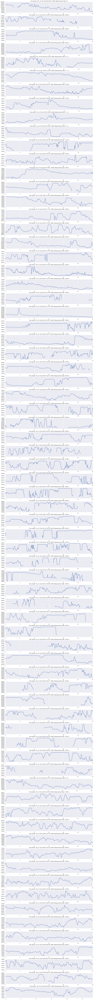

In [12]:
sleep_index = 0 

ppg_time_stamp_captures = sleep_data_captures.ix[sleep_index]['_vec.ir'].keys()
millisec = np.sort(np.array(list(ppg_time_stamp_captures), dtype = float))

# timestamps
captures_index = np.array(np.array(millisec, dtype = int), dtype=str)

# Calculate time interval between time stamps
capture_interval = millisec[1:] - millisec[:-1]
capture_interval = np.insert(capture_interval, 0, values = 0,  axis = 0)/1000

print('Capture intervals (sec) : ', capture_interval)
# print('')

# Visualize captures
f, axarr = plt.subplots(len(captures_index), 1)
f.set_figheight(2.5*len(captures_index))
f.set_figwidth(16)
f.subplots_adjust(hspace = 0.3)

for i in np.arange(len(captures_index)):
    ppg_ir = (sleep_data_captures.ix[sleep_index]['_vec.ir'])[captures_index[i]]
    time_ir = np.arange(len(ppg_ir))/sampling_rate
    
    # Get duration of time without recorded measuremement, i.e. time from last data point from
    # previous capture to the time of first data point in current capture
    if i > 0:
        measurement_gap = (capture_interval[i] - (len(ppg_ir))/sampling_rate)
    else: 
        measurement_gap = 0
        
    measurement_gap = str(round(measurement_gap, 3))
    axarr[i].plot(time_ir, ppg_ir)
    axarr[i].set_xlim(0, time_ir[-1])
    axarr[i].set_title('Time stamp: ' + time.strftime("%a, %d %b %Y %H:%M:%S +0000", 
                                             time.localtime(float(captures_index[i])/1000)) + ', Measurement Gap: ' + measurement_gap +' s')


### *Observations:*

* For the sleep data set above, the **captures** column contains all the recordings of the amiigo device during the sleep duration. 

    * The **captures** column has the following keys: 
    
    
    ['c.lvet', 'ppv.pc', 'c.rtt.orig', 'P', '_fs', 'deg.spn', '_diag.low.afib.is', '_vec.accel', 'i.m', '_label', 'amp.pp.pp', 'hrv.std', '_diag.thunder.is', 'i.lvef', 'c.qt.err', '_fs.accel', 'c.rtt.err', 'hrv.rms', 'hrv.rms.low.err', 'deg.sru', '_age', '_diag.ranon.is', 'brpm', 'c.qtc.err', 'hrv.std.err', '_vec.invalids', '_loc', '_is_manual', 'brpm.err', 'pp.volv', 'pp.sp/dp', 'bpm.cnt', 'deg.drd', '_is_vein', 'c.co', 'hrv.rms.err', 'b/a', '_diag.apnea.is', 'beats.valid', 'red.offset', 'c.qtc', 'spo2.err', 'pp.stvol', 'pp.vol.err', 'c.qrs', 'c.rtt', 'd/a', 'i.ef', 'pp.vol', '_vec.span', '_vec.clusters', '_sex', '_vec.ir', 'deg.sp', 'bpm', '_seq', '_in.start_accel', 'i.sru', 'delta', 'hrv.rms.low', 'ir.offset', '_diag.afib.is', 'brdb', '_vec.red', '_pk', 'c.qrs.err', 'ppv.pc.err', 'pp.nsp/ndp', 'pp.aug', 'hrv.pc', '_height', 'c.qt', 'spo2', 'stemp', 'bpm.ccnt', 'c.lvet.err', 'bpm.rng', 'pp.nsp/ref']
    
* Each key above corresponds to another dictionary whose keys are the timestamps of the ppg captures collected.
    * The actual ppg signals are in **_vec.ir** for the IR channel and **_vec.red** for the red channel.
    
    
* The infrared ppg signals found are all 30-second long. 


* The measurement gaps (duration with no measurement) between captures are not consistent. 


* The sleep HR interval set in the Amiigo app was 45 seconds. 

*Note: The sleep HR interval is interval between the start of each collection. I think, the device collects data for 30 seconds, and 15 seconds later (if the HR interval is 45 seconds), the device collects again. The minimum HR interval allowed by the app is 41 seconds, which would mean that there is measurement gap of approximately 11 seconds between every capture.  *


    

Capture intervals (sec) :  [   0.   48.   88.   39.   51.   38.   49.   49.   88.   39.   48.   60.
  137.   88.   49.   88.   39.   49.   88.   88.   88.   48.   40.   49.
   89.   87.   49.  137.   39.   50.   40.  135.   98.  138.   88.   48.
   39.   88.   50.   49.   39.   49.   39.   48.   49.   39.   49.   40.
   48.   40.   49.   49.   39.   48.]


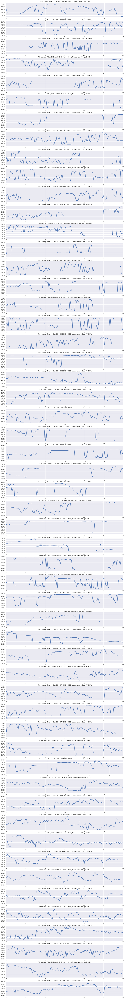

In [13]:
sleep_index = 3

ppg_time_stamp_captures = sleep_data_captures.ix[sleep_index]['_vec.ir'].keys()
millisec = np.sort(np.array(list(ppg_time_stamp_captures), dtype = float))

# timestamps
captures_index = np.array(np.array(millisec, dtype = int), dtype=str)

# Calculate time interval between time stamps
capture_interval = millisec[1:] - millisec[:-1]
capture_interval = np.insert(capture_interval, 0, values = 0,  axis = 0)/1000

print('Capture intervals (sec) : ', capture_interval)
# print('')

# Visualize captures
f, axarr = plt.subplots(len(captures_index), 1)
f.set_figheight(2.5*len(captures_index))
f.set_figwidth(16)
f.subplots_adjust(hspace = 0.3)

for i in np.arange(len(captures_index)):
    ppg_ir = (sleep_data_captures.ix[sleep_index]['_vec.ir'])[captures_index[i]]
    time_ir = np.arange(len(ppg_ir))/sampling_rate
    
    # Get duration of time without recorded measuremement, i.e. time from last data point from
    # previous capture to the time of first data point in current capture
    if i > 0:
        measurement_gap = (capture_interval[i] - (len(ppg_ir))/sampling_rate)
    else: 
        measurement_gap = 0
        
    measurement_gap = str(round(measurement_gap, 3))
    axarr[i].plot(time_ir, ppg_ir)
    axarr[i].set_xlim(0, time_ir[-1])
    axarr[i].set_title('Time stamp: ' + time.strftime("%a, %d %b %Y %H:%M:%S +0000", 
                                             time.localtime(float(captures_index[i])/1000)) + ', Measurement Gap: ' + measurement_gap +' s')


Capture intervals (sec) :  [  0.  51.  48.  39.  49.  39.  51.  37.  50.  49.  40.  48.  39.  48.  49.
  40.  49.  88.  40.  49.]


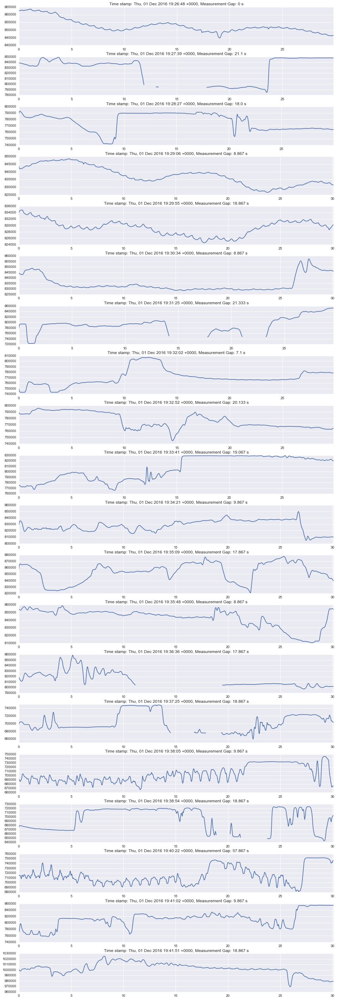

In [14]:
sleep_index = 7 

ppg_time_stamp_captures = sleep_data_captures.ix[sleep_index]['_vec.ir'].keys()
millisec = np.sort(np.array(list(ppg_time_stamp_captures), dtype = float))

# timestamps
captures_index = np.array(np.array(millisec, dtype = int), dtype=str)

# Calculate time interval between time stamps
capture_interval = millisec[1:] - millisec[:-1]
capture_interval = np.insert(capture_interval, 0, values = 0,  axis = 0)/1000

print('Capture intervals (sec) : ', capture_interval)
# print('')

# Visualize captures
f, axarr = plt.subplots(len(captures_index), 1)
f.set_figheight(2.5*len(captures_index))
f.set_figwidth(16)
f.subplots_adjust(hspace = 0.3)

for i in np.arange(len(captures_index)):
    ppg_ir = (sleep_data_captures.ix[sleep_index]['_vec.ir'])[captures_index[i]]
    time_ir = np.arange(len(ppg_ir))/sampling_rate
    
    # Get duration of time without recorded measuremement, i.e. time from last data point from
    # previous capture to the time of first data point in current capture
    if i > 0:
        measurement_gap = (capture_interval[i] - (len(ppg_ir))/sampling_rate)
    else: 
        measurement_gap = 0
        
    measurement_gap = str(round(measurement_gap, 3))
    axarr[i].plot(time_ir, ppg_ir)
    axarr[i].set_xlim(0, time_ir[-1])
    axarr[i].set_title('Time stamp: ' + time.strftime("%a, %d %b %Y %H:%M:%S +0000", 
                                             time.localtime(float(captures_index[i])/1000)) + ', Measurement Gap: ' + measurement_gap +' s')


Capture intervals (sec) :  [   0.   61.  137.   38.   49.   49.   39.   50.   38.   50.   39.   49.
   48.   39.   49.   40.   49.   49.   39.   49.   39.   49.   48.   49.
   49.   39.   51.   87.   48.   89.   48.   40.   88.   58.   39.   49.
   40.   49.   39.   49.   49.   40.   48.   39.   49.   39.]


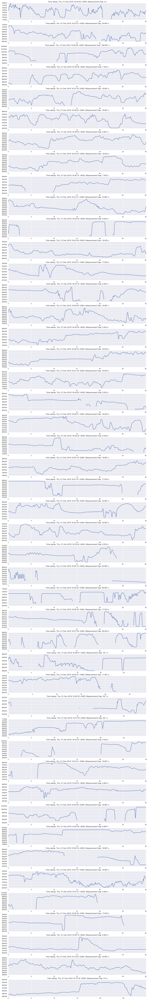

In [15]:
sleep_index = 8 

ppg_time_stamp_captures = sleep_data_captures.ix[sleep_index]['_vec.ir'].keys()
millisec = np.sort(np.array(list(ppg_time_stamp_captures), dtype = float))

# timestamps
captures_index = np.array(np.array(millisec, dtype = int), dtype=str)

# Calculate time interval between time stamps
capture_interval = millisec[1:] - millisec[:-1]
capture_interval = np.insert(capture_interval, 0, values = 0,  axis = 0)/1000

print('Capture intervals (sec) : ', capture_interval)
# print('')

# Visualize captures
f, axarr = plt.subplots(len(captures_index), 1)
f.set_figheight(2.5*len(captures_index))
f.set_figwidth(16)
f.subplots_adjust(hspace = 0.3)

for i in np.arange(len(captures_index)):
    ppg_ir = (sleep_data_captures.ix[sleep_index]['_vec.ir'])[captures_index[i]]
    time_ir = np.arange(len(ppg_ir))/sampling_rate
    
    # Get duration of time without recorded measuremement, i.e. time from last data point from
    # previous capture to the time of first data point in current capture
    if i > 0:
        measurement_gap = (capture_interval[i] - (len(ppg_ir))/sampling_rate)
    else: 
        measurement_gap = 0
        
    measurement_gap = str(round(measurement_gap, 3))
    axarr[i].plot(time_ir, ppg_ir)
    axarr[i].set_xlim(0, time_ir[-1])
    axarr[i].set_title('Time stamp: ' + time.strftime("%a, %d %b %Y %H:%M:%S +0000", 
                                             time.localtime(float(captures_index[i])/1000)) + ', Measurement Gap: ' + measurement_gap +' s')


In [18]:
#### Use data from another user
user = 'jed'
userid = users.loc[users['username'] == user].id.values

sleep_data_user = (sleep_data.loc[sleep_data['user_id'] == userid[0]]).reset_index()


In [19]:
sleep_data_captures = sleep_data_user.captures


Capture intervals (sec) :  [   0.  425.  416.  425.  415.  425.  415.  425.  415.  425.  415.  424.
  416.  425.  414.  426.  414.  424.  415.  425.  415.  425.  415.  425.
  416.  425.  415.  425.  416.  425.  415.  425.  415.  426.  415.  424.
  416.  425.  414.  426.  413.  425.  416.  425.  415.  425.  414.  426.
  415.  425.]


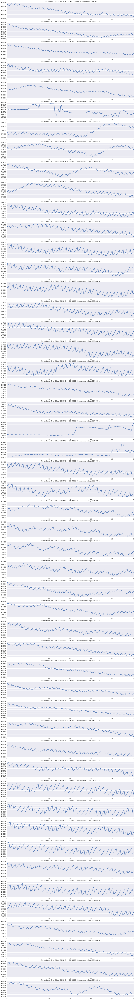

In [20]:
sleep_index = 0 

ppg_time_stamp_captures = sleep_data_captures.ix[sleep_index]['_vec.ir'].keys()
millisec = np.sort(np.array(list(ppg_time_stamp_captures), dtype = float))

# timestamps
captures_index = np.array(np.array(millisec, dtype = int), dtype=str)

# Calculate time interval between time stamps
capture_interval = millisec[1:] - millisec[:-1]
capture_interval = np.insert(capture_interval, 0, values = 0,  axis = 0)/1000

print('Capture intervals (sec) : ', capture_interval)
# print('')

# Visualize captures
f, axarr = plt.subplots(len(captures_index), 1)
f.set_figheight(2.5*len(captures_index))
f.set_figwidth(16)
f.subplots_adjust(hspace = 0.3)

for i in np.arange(len(captures_index)):
    ppg_ir = (sleep_data_captures.ix[sleep_index]['_vec.ir'])[captures_index[i]]
    time_ir = np.arange(len(ppg_ir))/sampling_rate
    
    # Get duration of time without recorded measuremement, i.e. time from last data point from
    # previous capture to the time of first data point in current capture
    if i > 0:
        measurement_gap = (capture_interval[i] - (len(ppg_ir))/sampling_rate)
    else: 
        measurement_gap = 0
        
    measurement_gap = str(round(measurement_gap, 3))
    axarr[i].plot(time_ir, ppg_ir)
    axarr[i].set_xlim(0, time_ir[-1])
    axarr[i].set_title('Time stamp: ' + time.strftime("%a, %d %b %Y %H:%M:%S +0000", 
                                             time.localtime(float(captures_index[i])/1000)) + ', Measurement Gap: ' + measurement_gap +' s')


Capture intervals (sec) :  [   0.  425.  415.  424.  414.  426.  414.  425.  415.  424.  415.  425.
  417.  424.  425.  415.  425.  415.  425.  415.  425.  414.  425.  415.
  425.  416.  425.  414.  425.  415.  425.  415.  424.  414.  426.  414.
  425.  416.  425.  415.  425.  415.  425.  415.  425.  414.  425.  416.
  425.  416.  424.  415.  425.]


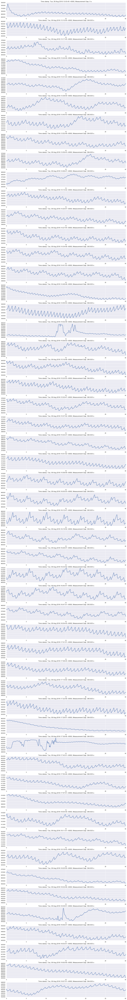

In [21]:
sleep_index = 1 

ppg_time_stamp_captures = sleep_data_captures.ix[sleep_index]['_vec.ir'].keys()
millisec = np.sort(np.array(list(ppg_time_stamp_captures), dtype = float))

# timestamps
captures_index = np.array(np.array(millisec, dtype = int), dtype=str)

# Calculate time interval between time stamps
capture_interval = millisec[1:] - millisec[:-1]
capture_interval = np.insert(capture_interval, 0, values = 0,  axis = 0)/1000

print('Capture intervals (sec) : ', capture_interval)
# print('')

# Visualize captures
f, axarr = plt.subplots(len(captures_index), 1)
f.set_figheight(2.5*len(captures_index))
f.set_figwidth(16)
f.subplots_adjust(hspace = 0.3)

for i in np.arange(len(captures_index)):
    ppg_ir = (sleep_data_captures.ix[sleep_index]['_vec.ir'])[captures_index[i]]
    time_ir = np.arange(len(ppg_ir))/sampling_rate
    
    # Get duration of time without recorded measuremement, i.e. time from last data point from
    # previous capture to the time of first data point in current capture
    if i > 0:
        measurement_gap = (capture_interval[i] - (len(ppg_ir))/sampling_rate)
    else: 
        measurement_gap = 0
        
    measurement_gap = str(round(measurement_gap, 3))
    axarr[i].plot(time_ir, ppg_ir)
    axarr[i].set_xlim(0, time_ir[-1])
    axarr[i].set_title('Time stamp: ' + time.strftime("%a, %d %b %Y %H:%M:%S +0000", 
                                             time.localtime(float(captures_index[i])/1000)) + ', Measurement Gap: ' + measurement_gap +' s')
